In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import sys
import anndata
import scvi


In [2]:
def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '../results/images/integrated/clean/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=200)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
absl                NA
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiw

'/opt/conda/bin/python'

In [4]:
adata= sc.read('../results/scVI/S2_scVIintegrated_adata_latent30.h5ad')

# Loading log regression label transfering

In [5]:
prediction= pd.read_csv('../results/log_regression/logreg_from_P13_downsampled_fine_troph_to_explant_premrna_HVGs_predictions.csv', index_col=0)

In [6]:
prediction

,celltype_predictions,probabilities
Pla_HDBR10917729_AAACCCACATCGAACT,VCT_CCC,0.339568
Pla_HDBR10917729_AAACCCAGTAAGACCG,dS2,0.455602
Pla_HDBR10917729_AAACCCAGTGGGATTG,SCT,0.588302
Pla_HDBR10917729_AAACGAAAGCCTAACT,EVT_1,0.573230
Pla_HDBR10917729_AAACGAAAGCCTGGAA,fF,0.999952
...,...,...
Pla_HDBR11345033_TTTGTTGGTAAGATAC,HOFB,0.859873
Pla_HDBR11345033_TTTGTTGGTCCCTGTT,fF,0.993109
Pla_HDBR11345033_TTTGTTGGTCGGCACT,fF,0.934756
Pla_HDBR11345033_TTTGTTGGTCTCCCTA,dM1,0.993633


In [7]:
adata.obs= adata.obs.join(prediction)

In [8]:
adata.obs

,n_genes,sample,donor,termination,day,pcw,percent_mito,n_counts,batch,sample_barcode,...,is_doublet,_scvi_batch,_scvi_labels,_scvi_local_l_mean,_scvi_local_l_var,leiden_pca,scrublet_doublet,leiden_scvi,celltype_predictions,probabilities
Pla_HDBR10917729_AAACCCACATCGAACT,1938,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.004617,6715.0,0,Pla_HDBR10917729_AAACCCACATCGAACT,...,False,0,0,9.276571,1.454397,14,singlet,8,VCT_CCC,0.339568
Pla_HDBR10917729_AAACCCAGTAAGACCG,449,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.008159,858.0,0,Pla_HDBR10917729_AAACCCAGTAAGACCG,...,False,0,0,9.276571,1.454397,18,singlet,14,dS2,0.455602
Pla_HDBR10917729_AAACCCAGTGGGATTG,779,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.005693,1581.0,0,Pla_HDBR10917729_AAACCCAGTGGGATTG,...,False,0,0,9.276571,1.454397,52,singlet,8,SCT,0.588302
Pla_HDBR10917729_AAACGAAAGCCTAACT,1177,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.047320,3022.0,0,Pla_HDBR10917729_AAACGAAAGCCTAACT,...,False,0,0,9.276571,1.454397,18,singlet,14,EVT_1,0.573230
Pla_HDBR10917729_AAACGAAAGCCTGGAA,3605,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.066152,11005.0,0,Pla_HDBR10917729_AAACGAAAGCCTGGAA,...,False,0,0,9.276571,1.454397,13,singlet,3,fF,0.999952
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Pla_HDBR11345033_TTTGTTGGTAAGATAC,628,Pla_HDBR11345033,Hrv124,surgical,d2,11pcw,0.030624,849.0,11,Pla_HDBR11345033_TTTGTTGGTAAGATAC,...,False,11,0,8.319507,2.655493,7,singlet,12,HOFB,0.859873
Pla_HDBR11345033_TTTGTTGGTCCCTGTT,690,Pla_HDBR11345033,Hrv124,surgical,d2,11pcw,0.054726,1005.0,11,Pla_HDBR11345033_TTTGTTGGTCCCTGTT,...,False,11,0,8.319507,2.655493,7,singlet,12,fF,0.993109
Pla_HDBR11345033_TTTGTTGGTCGGCACT,742,Pla_HDBR11345033,Hrv124,surgical,d2,11pcw,0.029722,1043.0,11,Pla_HDBR11345033_TTTGTTGGTCGGCACT,...,False,11,0,8.319507,2.655493,7,singlet,12,fF,0.934756
Pla_HDBR11345033_TTTGTTGGTCTCCCTA,633,Pla_HDBR11345033,Hrv124,surgical,d2,11pcw,0.046256,908.0,11,Pla_HDBR11345033_TTTGTTGGTCTCCCTA,...,False,11,0,8.319507,2.655493,7,singlet,12,dM1,0.993633


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:23)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:30)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:33)


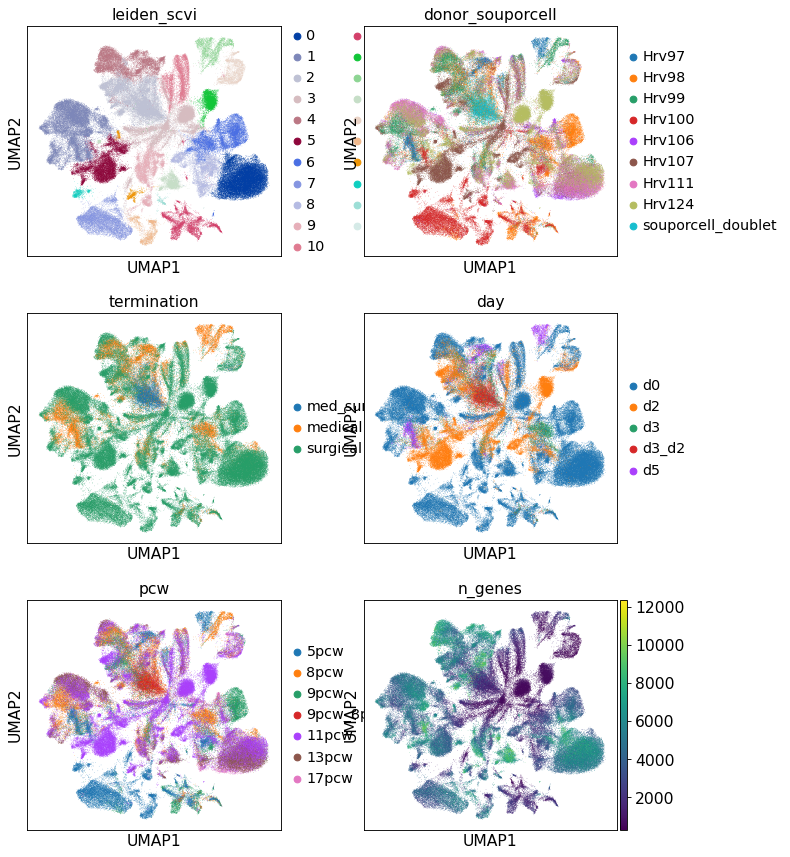

In [30]:
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_scVI_n_latent_30")
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'donor_souporcell', 'termination', 
                         'day','pcw','n_genes' ], ncols=2, save='_scVI_latent30_labTransfering.pdf')

... storing 'souporcell_MFgenotype' as categorical


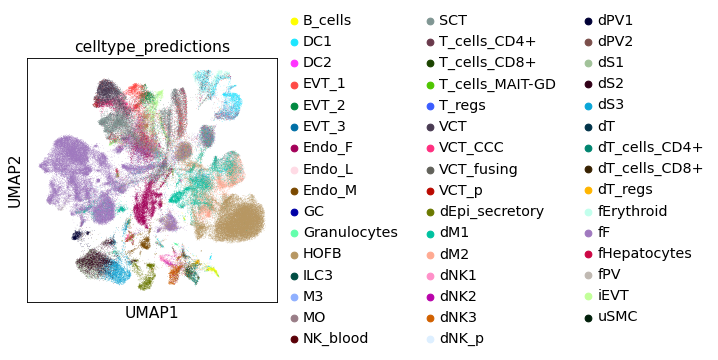

In [22]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=['celltype_predictions' ], ncols=2, save='_scVI_latent30_labTransfering.pdf')

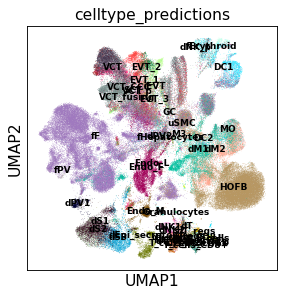

In [24]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=['celltype_predictions' ], legend_loc='on data',legend_fontsize='xx-small', save='_scVI_latent30_labTransfering2.pdf')

---

## Adding SoC Maternal-Foetal annotation

In [ ]:
samples = list(np.unique(adata.obs['sample']))

In [ ]:
#removing samples without SoC run
for sample in ['Pla_HDBR10917732','Pla_HDBR11345027','Pla_HDBR11345028','Pla_HDBR11345029','Pla_HDBR11345033']:
    samples.remove(sample)
    
    #Pla_HDBR10917732 is a special case and will be loaded separately
    # as it has k=4 (multiplexed samples & maternal-foetal genotype)

In [ ]:
samples

In [ ]:
# reading in souporcell outputs
# sample to cluster
souporcell_clusters = {}


for sample in samples:
    print('sample', sample)
    path = '../data/souporcell/maternal_foetal/'+sample+'/clusters.tsv' #path to the souporcell output
    souporcell_clusters[sample] = pd.read_csv(path, sep='\t') #read souporcell output as pandas DF
    #aadind the DF into the dictionary
    souporcell_clusters[sample]['sample_barcode'] = [sample+'_'+j for j in souporcell_clusters[sample]['barcode']]
    souporcell_clusters[sample]['sample_barcode'] = [elem.split('-')[0] for elem in souporcell_clusters[sample]['sample_barcode']]
    souporcell_clusters[sample].set_index('sample_barcode', drop=False, inplace=True)

In [ ]:
adata.obs['sample_barcode'] = adata.obs.index

In [ ]:
adata.obs.head

In [ ]:
#Function to add the souporcell id

def add_souporcell_id(adata_obj, cell_id):
    '''
    Function to add the souporcell status (e.g. 0,1, not pooled, etc.) to the cells
    
    Input
        adata_obj: adata object
        cell_id: id of a cell
    
    '''
    
    curr_sample = adata_obj.obs.loc[cell_id, 'sample']
    
    #print('sample',sample, 'barcode', cell_id)
    
    if curr_sample in samples:
        #extracts the table contained in the indicated key of the dictionary
        curr_souporcell_table = souporcell_clusters[curr_sample]
        
        if (cell_id in list(curr_souporcell_table.index)): #checking that the cells are into the data
            curr_assign = souporcell_clusters[curr_sample].loc[cell_id,'assignment']
            #print('returning',curr_assign)
            return(curr_assign)

        else:
            # cell barcode is filtered by souporcell
            return('filtered_by_souporcell')
    else:
        return('not_pooled')

In [ ]:
#Adding the SoC pooled status
%%time

adata.obs['souporcell_MFgenotype'] = adata.obs['sample_barcode'].apply(lambda x: add_souporcell_id(adata,x))

In [21]:
adata.obs.head

<bound method NDFrame.head of                                    n_genes            sample   donor  \
Pla_HDBR10917729_AAACCCACATCGAACT     1938  Pla_HDBR10917729   Hrv97   
Pla_HDBR10917729_AAACCCAGTAAGACCG      449  Pla_HDBR10917729   Hrv97   
Pla_HDBR10917729_AAACCCAGTGGGATTG      779  Pla_HDBR10917729   Hrv97   
Pla_HDBR10917729_AAACGAAAGCCTAACT     1177  Pla_HDBR10917729   Hrv97   
Pla_HDBR10917729_AAACGAAAGCCTGGAA     3605  Pla_HDBR10917729   Hrv97   
...                                    ...               ...     ...   
Pla_HDBR11345033_TTTGTTGGTAAGATAC      628  Pla_HDBR11345033  Hrv124   
Pla_HDBR11345033_TTTGTTGGTCCCTGTT      690  Pla_HDBR11345033  Hrv124   
Pla_HDBR11345033_TTTGTTGGTCGGCACT      742  Pla_HDBR11345033  Hrv124   
Pla_HDBR11345033_TTTGTTGGTCTCCCTA      633  Pla_HDBR11345033  Hrv124   
Pla_HDBR11345033_TTTGTTGGTTGTTGCA      678  Pla_HDBR11345033  Hrv124   

                                  termination day    pcw  percent_mito  \
Pla_HDBR10917729_AAACCCACATCGAA

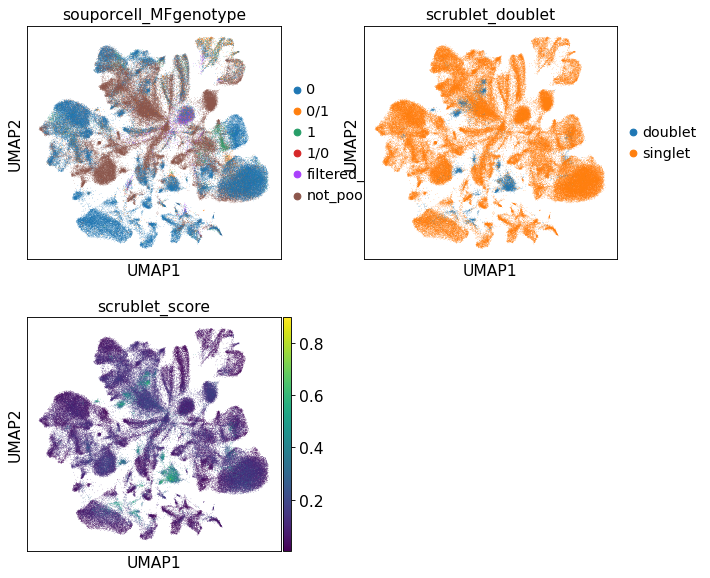

In [35]:
sc.pl.umap(adata, color=["souporcell_MFgenotype","scrublet_doublet","scrublet_score"], ncols=2)

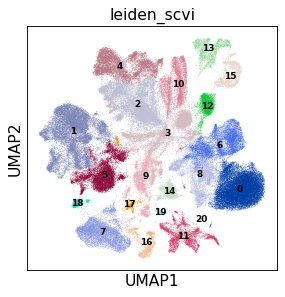

In [34]:
sc.pl.umap(adata, color=["leiden_scvi",],legend_loc='on data',legend_fontsize='xx-small', ncols=2)

## Cluster pre-labeling

The marker genes already reported for different cell types were intensively analysed, together with the clusters' markers, and the label trasfering.

As a result the following identities were assigned:
0: HBs
1: Fibroblasts1
2: doublets & SCT
3: Unknown
4: VCT & EVT
5: Fibroblasts2
6: dM
7: dS
8: dM2
9: Endo
10: Unknown2
11: T, B & NK cells
12: Unknown3
13: Erythrocyte1
14: doublets
15: Erythrocyte2
16: Epi
17: Unknown4
18: Unknown5
19: Unknown6
20: GR

In [42]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
adata.obs['identity']= adata.obs['leiden_scvi']

In [43]:
adata.obs['identity']

Pla_HDBR10917729_AAACCCACATCGAACT    10
Pla_HDBR10917729_AAACCCAGTAAGACCG    13
Pla_HDBR10917729_AAACCCAGTGGGATTG    10
Pla_HDBR10917729_AAACGAAAGCCTAACT    13
Pla_HDBR10917729_AAACGAAAGCCTGGAA     1
                                     ..
Pla_HDBR11345033_TTTGTTGGTAAGATAC    12
Pla_HDBR11345033_TTTGTTGGTCCCTGTT    12
Pla_HDBR11345033_TTTGTTGGTCGGCACT    12
Pla_HDBR11345033_TTTGTTGGTCTCCCTA    12
Pla_HDBR11345033_TTTGTTGGTTGTTGCA    15
Name: identity, Length: 149617, dtype: category
Categories (21, object): ['0', '1', '2', '3', ..., '17', '18', '19', '20']

In [44]:
new_cluster_names = [
    'HBs', 'F_c1','doublets & SCT','Unk','VCT & EVT','F_c2',
    'dM','dS','dM2','Endo','Unk2','T, B & NK cells','Unk3','Ery1',
    'doublets','Ery2','Epi','Unk4','Unk5','Unk6','GR']
adata.rename_categories('identity', new_cluster_names)

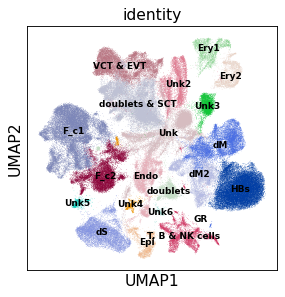

In [45]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='xx-small',
           save='_scVI_latent30_indentityDirty.pdf')

## Removal of scrublet doublets, doublet cluster, and Erythrocytes

In [46]:
adata = adata[adata.obs['identity'] != 'doublets']
#adata = adata[adata.obs['identity'] != 'doublets']
adata = adata[adata.obs['scrublet_doublet'] != 'doublet']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


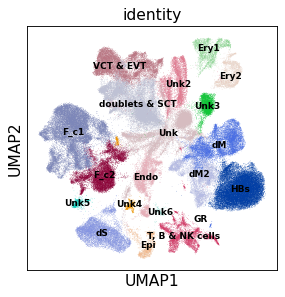

In [48]:
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='xx-small')

## Re-running Clustering to delete doublets

In [49]:
#LATENT 30
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=45, use_rep="X_scVI_n_latent_30")
sc.tl.umap(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:31)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:12)


running Leiden clustering
    finished: found 26 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:33)


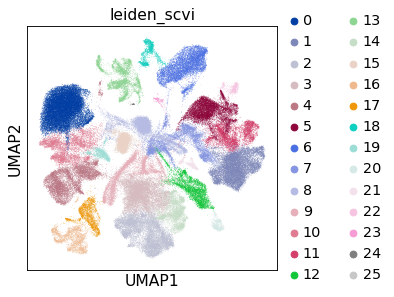

In [52]:
#clustering. Increasing resolution to separate doublets and delete them.
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.4)

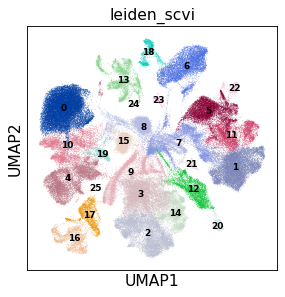

In [54]:
sc.pl.umap(adata, color=["leiden_scvi"],legend_loc='on data',legend_fontsize='xx-small')

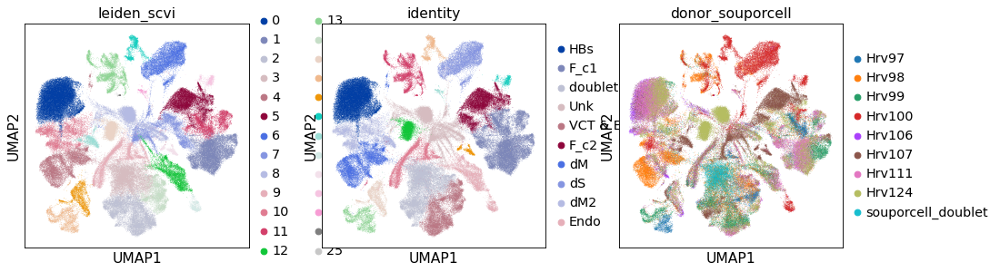

In [53]:
sc.pl.umap(adata, color=["leiden_scvi",'identity','donor_souporcell'])

In [55]:
#Deleting the doublets: in this case I can easily overlap the doublets identified by SoC
# and the cluster corresponding to them

adata = adata[adata.obs['leiden_scvi'] != '3']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [57]:
## Re-running the clustering now that most of the doublets were deleted

#LATENT 30
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=45, use_rep="X_scVI_n_latent_30")
sc.tl.umap(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:29)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:03)


In [59]:
#clustering. Increasing resolution to separate doublets and delete them.
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.4)

running Leiden clustering
    finished: found 25 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:32)


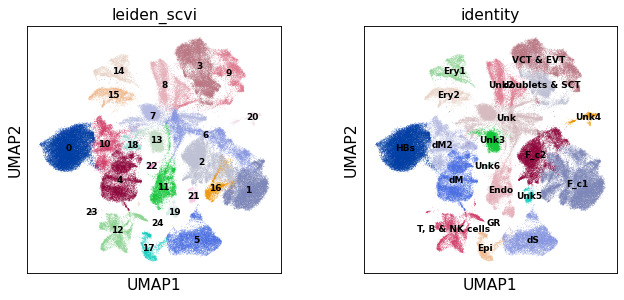

In [61]:
sc.pl.umap(adata, color=["leiden_scvi",'identity'], ncols=2, legend_loc='on data',legend_fontsize='xx-small')

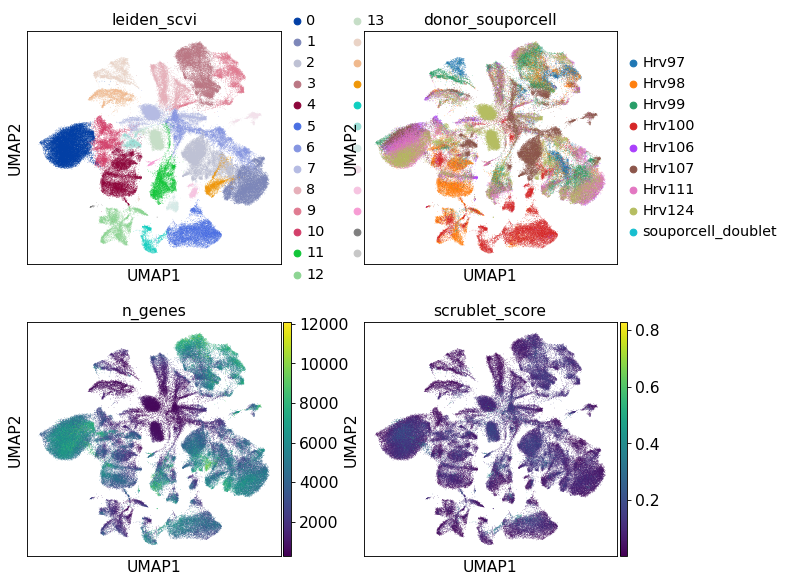

In [5]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'donor_souporcell',
                         'n_genes','scrublet_score' ], ncols=2)

Saving the object semi-clean

In [63]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_noDoublets.h5ad')

In [4]:
#adata= sc.read('../results/scVI/S2_scVIintegrated_adata_latent30_noDoublets.h5ad')

## Clusters Fine labeling

In [64]:
sc.tl.rank_genes_groups(
    adata,
    "leiden_scvi",
    method="wilcoxon",
    use_raw=True,
    key_added="rank_genes_groups_wilcox",
    n_genes=20,
)

ranking genes
    finished: added to `.uns['rank_genes_groups_wilcox']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:11:05)


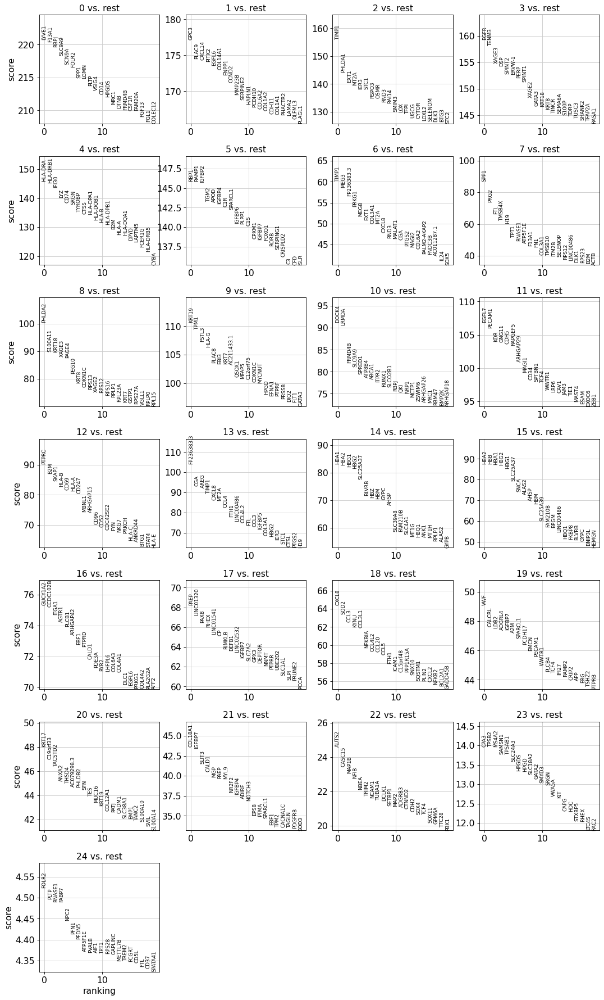

In [65]:

sc.pl.rank_genes_groups(adata, key="rank_genes_groups_wilcox", sharey=False, n_genes=20, show=True)

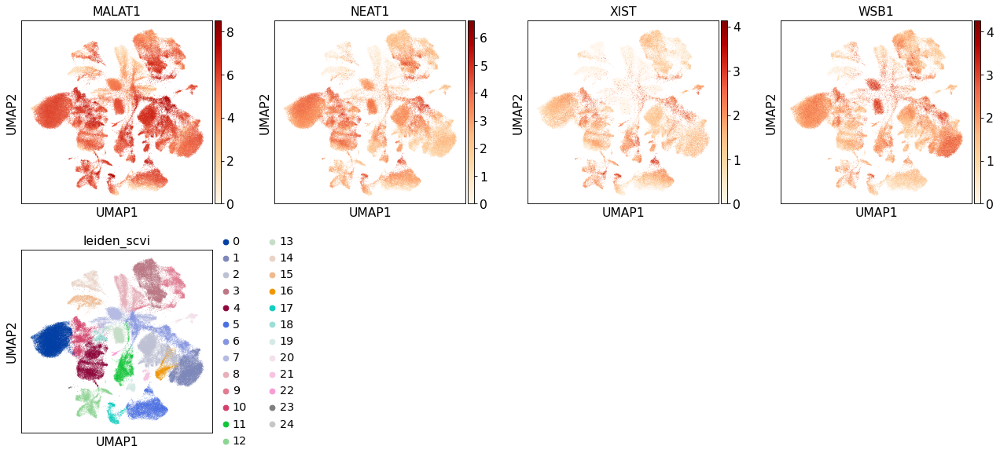

In [5]:
sc.pl.umap(adata, color=['MALAT1', 'NEAT1', 'XIST', 'WSB1','leiden_scvi'],color_map='OrRd')

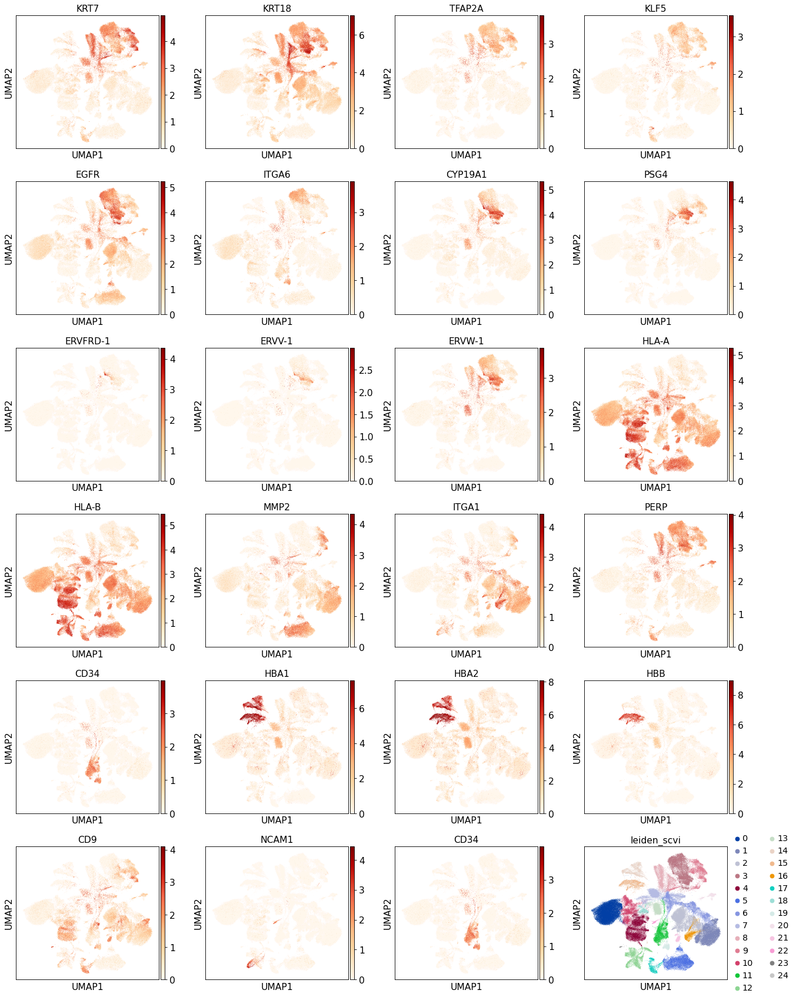

In [27]:
sc.pl.umap(adata, color=['KRT7','KRT18', 'TFAP2A', 'KLF5', 'EGFR' ,'ITGA6', 'CYP19A1','PSG4','ERVFRD-1', 'ERVV-1', 'ERVW-1', 
                         'HLA-A','HLA-B', 'MMP2', 'ITGA1', 'PERP', 'CD34', 'HBA1','HBA2','HBB',
                         'CD9','NCAM1','leiden_scvi'],color_map='OrRd',
           save='_otherMarkers_scVI_latent30.pdf')

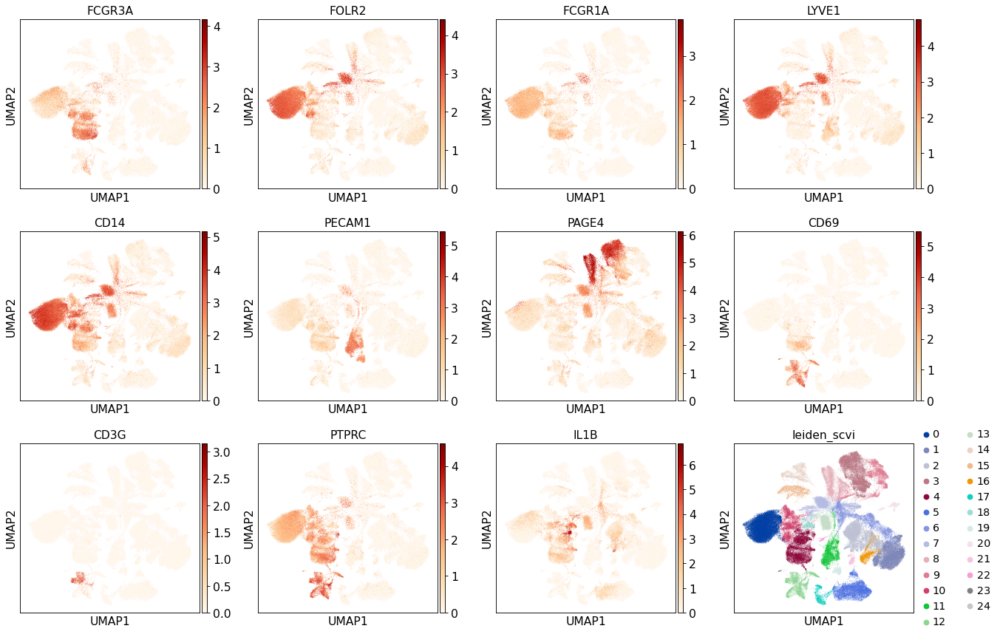

In [28]:
#placenta Immune markers
sc.pl.umap(adata, color=['FCGR3A', 'FOLR2', 'FCGR1A', 'LYVE1', 'CD14','PECAM1','PAGE4',
                         'CD69', 'CD3G','PTPRC','IL1B','leiden_scvi'],color_map='OrRd',
           save='_placentaImmuneMarkers_scVI_latent30.pdf')

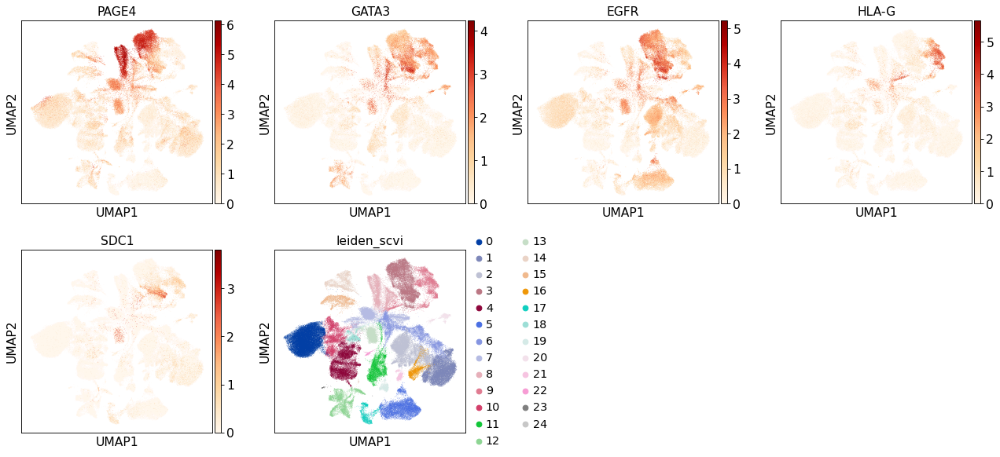

In [29]:
#trophoblats markers
sc.pl.umap(adata, color=['PAGE4', 'GATA3', 'EGFR', 'HLA-G','SDC1','leiden_scvi']
           ,color_map='OrRd', save='_trophoblastMarkers_scVI_latent30.pdf')

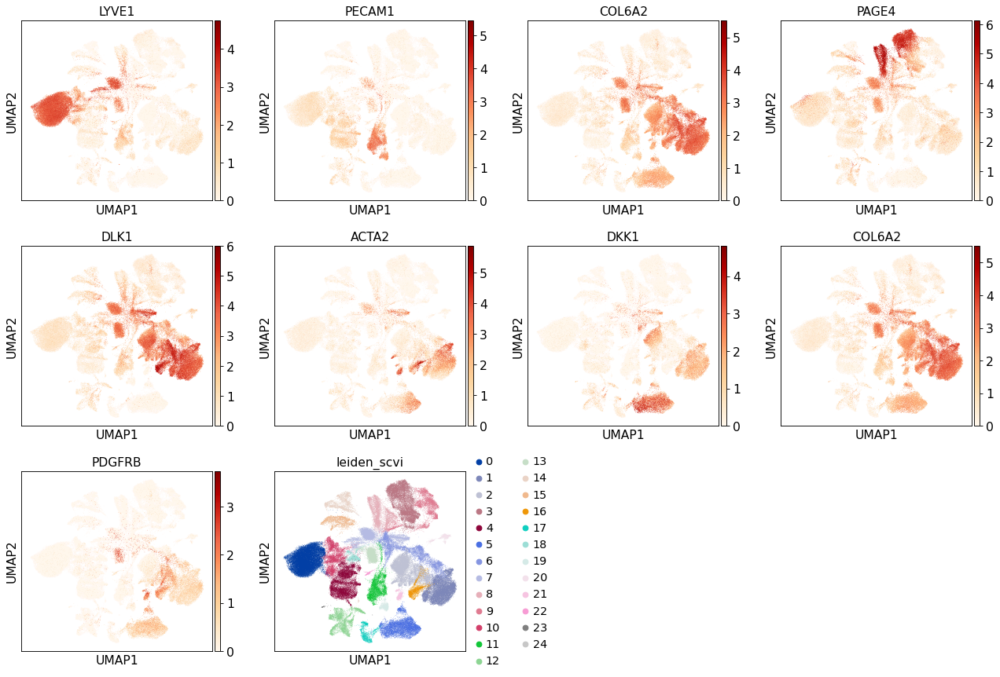

In [30]:
#placenta markers
sc.pl.umap(adata, color=['LYVE1', 'PECAM1', 'COL6A2', 'PAGE4',
                        'DLK1', 'ACTA2','DKK1', 'COL6A2','PDGFRB', 'leiden_scvi'],
           color_map='OrRd', save='_placentaMarkers_scVI_latent30.pdf')

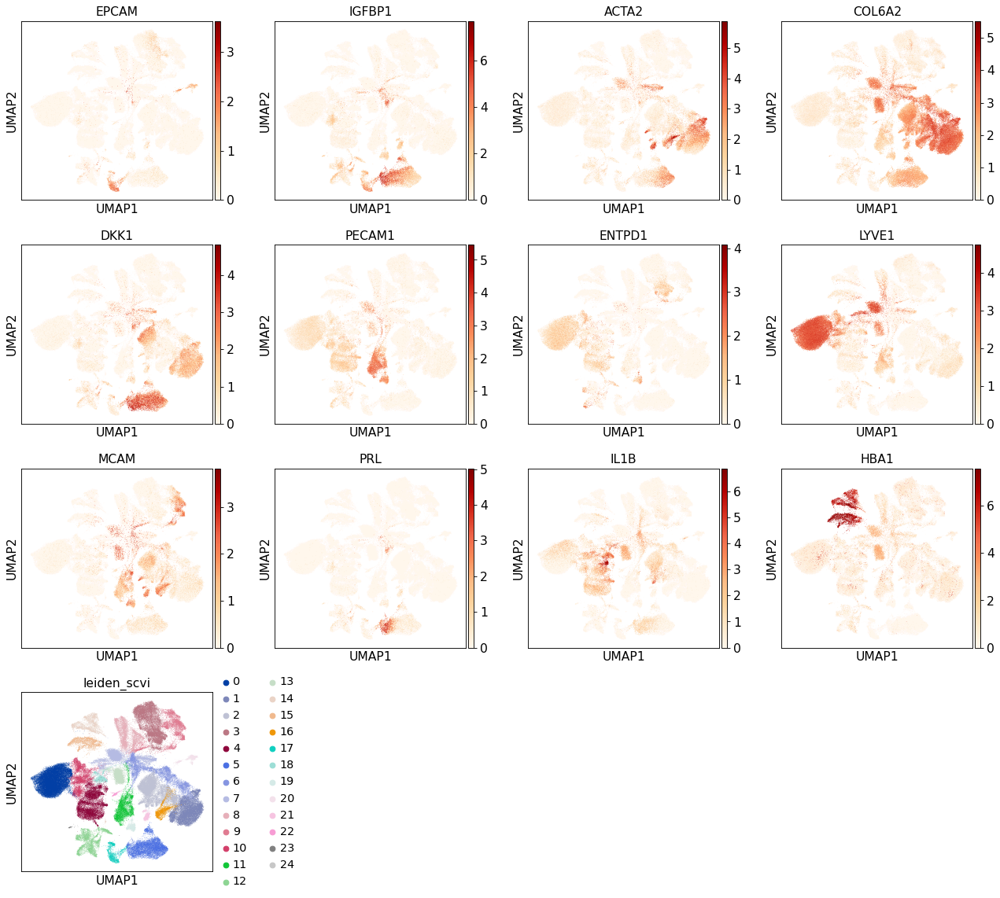

In [31]:
#decidua markers
sc.pl.umap(adata, color=['EPCAM', 'IGFBP1', 'ACTA2', 'COL6A2', 'DKK1','PECAM1','ENTPD1', 'LYVE1', 'MCAM',
                         'PRL','IL1B','HBA1',
                         'leiden_scvi'],color_map='OrRd', save='_deciduaMarkers_scVI_latent30.pdf')

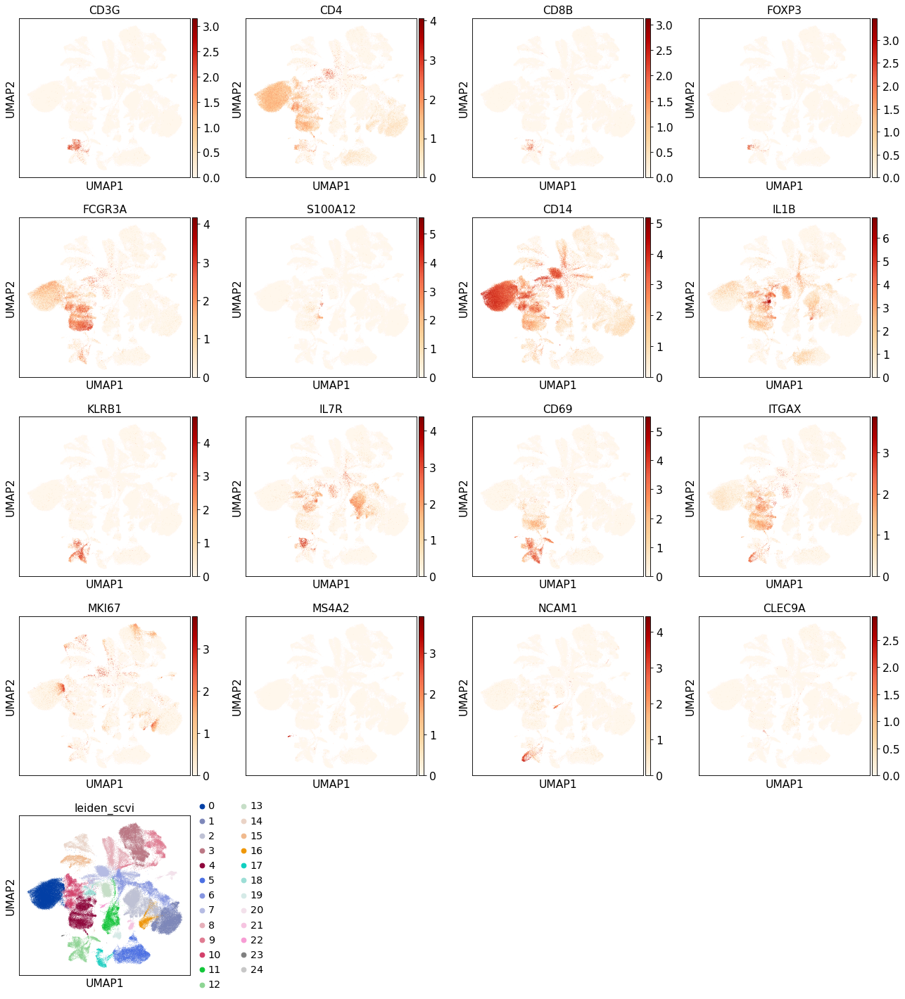

In [32]:
#Decidua Immune markers
sc.pl.umap(adata, color=[ 'CD3G', 'CD4', 'CD8B', 'FOXP3', 'FCGR3A','S100A12','CD14','IL1B',
                         'KLRB1','IL7R','CD69','ITGAX','MKI67','MS4A2','NCAM1', 'CLEC9A',
                         'leiden_scvi'],color_map='OrRd', save='_deciduaImmuneMarkers_scVI_latent30.pdf')

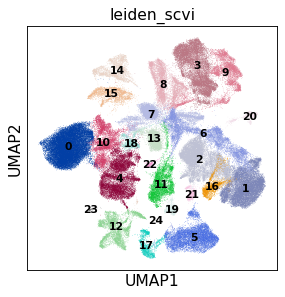

In [33]:
sc.pl.umap(adata, color=[ 'leiden_scvi'],ncols=2, legend_loc='on data',legend_fontsize='x-small',
          save='_leiden_scVI_latent30.pdf')

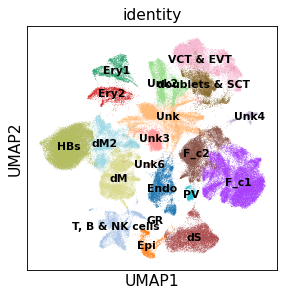

In [34]:
sc.pl.umap(adata, color=[ 'identity'],ncols=2, legend_loc='on data',legend_fontsize='x-small',
          save='_identity_scVI_latent30.pdf')

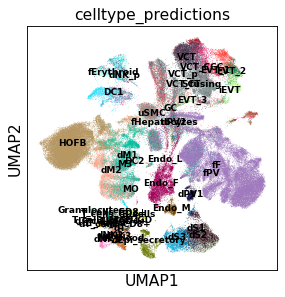

In [35]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=['celltype_predictions' ], legend_loc='on data',legend_fontsize='xx-small', save='_scVI_latent30_labTransfering3.pdf')

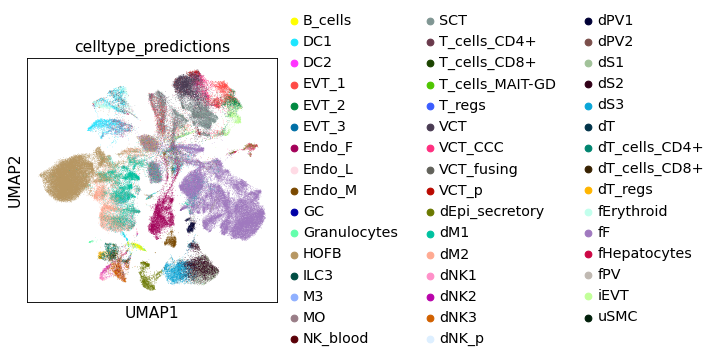

In [36]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=['celltype_predictions' ], save='_scVI_latent30_labTransfering3.1.pdf')

## Cluster 21

In [38]:
#Selecting the cells in cluster 21
temp_cells = adata[adata.obs['leiden_scvi'] == '21']


#Function that changes the cluster names as indicated
temp_cells.obs['identity'] = (temp_cells.obs["leiden_scvi"].map(lambda x: 
                            {"21": "PV"}
                            .get(x, x)).astype("category"))

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.obs` of view, copying.


In [39]:
#converting categorical into strings to introduce new categories into the original adata object
adata.obs['identity']=adata.obs['identity'].astype("string")

In [40]:
#assigning the new categories to the cells in adata
for cell in temp_cells.obs.index:
    adata.obs['identity'][cell] = temp_cells.obs['identity'][cell]

#Returning strings into categorical 
adata.obs['identity']=adata.obs['identity'].astype("category")

In [41]:
#Removing remanent cells from the Unk5 cluster that doesn't match anywhere
adata = adata[adata.obs['identity'] != 'Unk5']

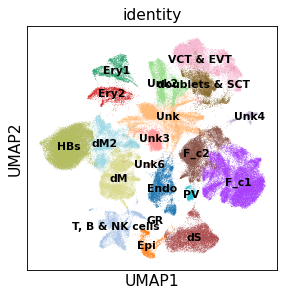

In [42]:
sc.pl.umap(adata, color=[ 'identity'],ncols=2, legend_loc='on data',legend_fontsize='x-small')

#### NOTE:
The unknown cluster (6,7,8, 13 and 22) express many of the reported clusters for different cell types tissue. After analysing the marker genes,
mito%, and number of genes, and with the team's advice, I concluded it looks like apoptotic cells. Therefore, I will remove that cluster.

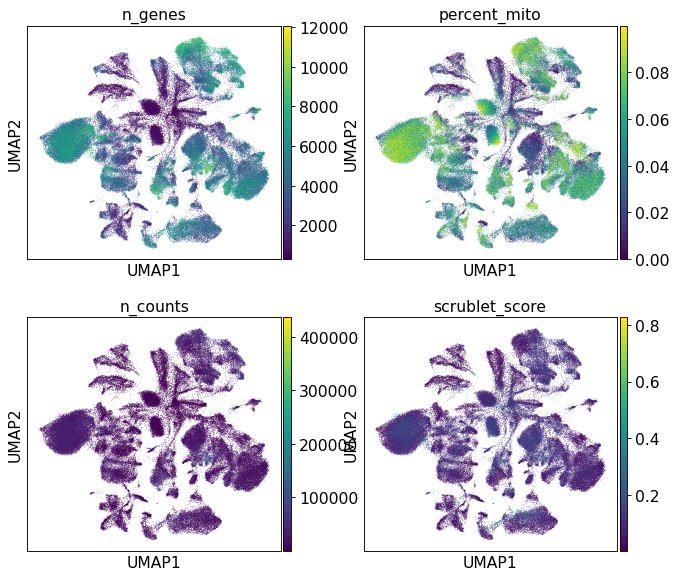

In [43]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["n_genes",'percent_mito','n_counts',
                         'scrublet_score' ], ncols=2)

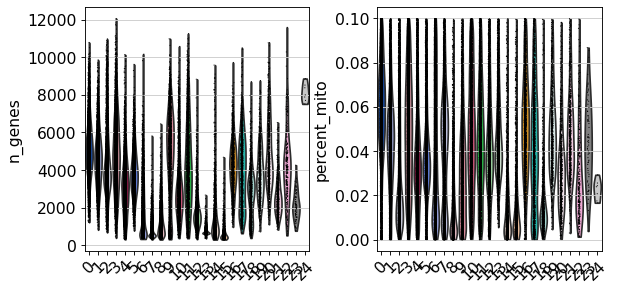

In [44]:
sc.pl.violin(adata, keys=["n_genes",'percent_mito'], groupby='leiden_scvi',rotation=45)

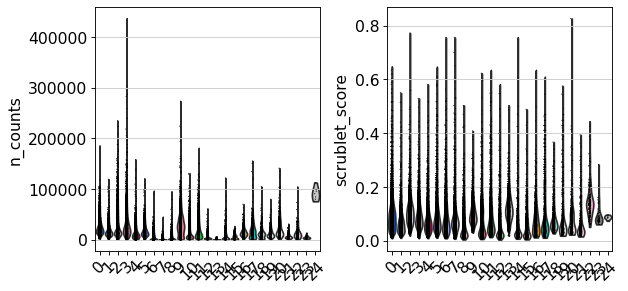

In [45]:
sc.pl.violin(adata, keys=["n_counts",'scrublet_score'], groupby='leiden_scvi',rotation=45)

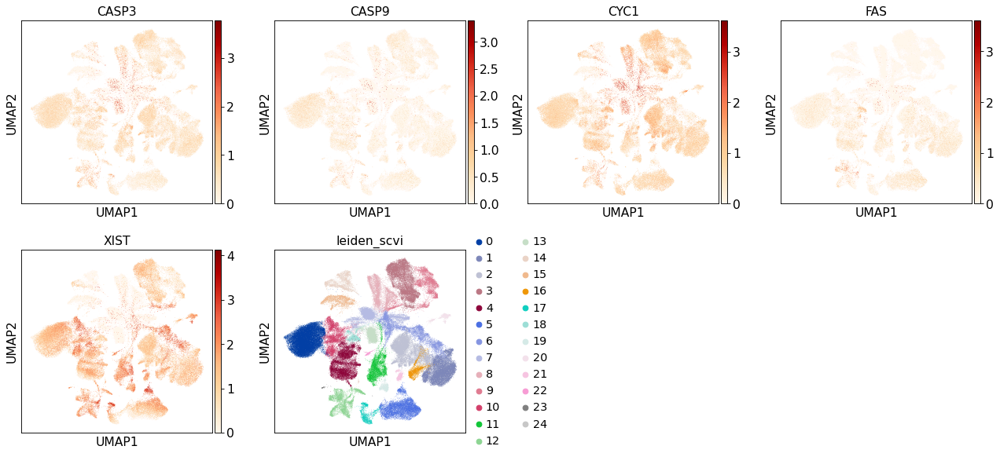

In [46]:
sc.pl.umap(adata, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST', 'leiden_scvi'],color_map='OrRd',
           save='_scVI_latent30_apoptosisMarkers.pdf')

In [49]:
adata = adata[adata.obs['leiden_scvi'] != '6']
adata = adata[adata.obs['identity'] != 'Unk']

adata = adata[adata.obs['leiden_scvi'] != '7']

adata = adata[adata.obs['leiden_scvi'] != '8']
adata = adata[adata.obs['identity'] != 'Unk2']

adata = adata[adata.obs['leiden_scvi'] != '13']
adata = adata[adata.obs['identity'] != 'Unk3']

adata = adata[adata.obs['leiden_scvi'] != '22']
adata = adata[adata.obs['identity'] != 'Unk6']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [50]:
adata = adata[adata.obs['identity'] != 'Unk4']

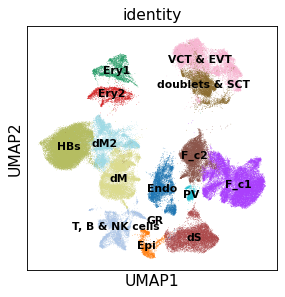

In [51]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [52]:
#LATENT 30
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=45, use_rep="X_scVI_n_latent_30")
sc.tl.umap(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:54)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:28)


In [53]:
#clustering. Increasing resolution to separate doublets and delete them.
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:00:22)


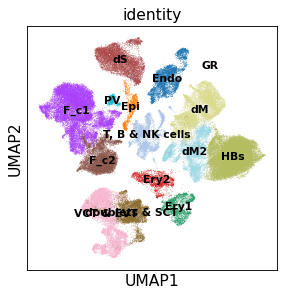

In [54]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [55]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_noDoublets.h5ad')